In [1]:
%matplotlib inline
from pylab import rcParams
rcParams['figure.figsize'] = 12, 8
from NV import *

In [2]:
def EPR_NoRef(EPRfiles,Pfiles):
    pseq = np.loadtxt(Pfiles)
    files = glob.glob(EPRfiles)
    d_sum = np.zeros((pseq.shape[0],))
    l = pseq.shape[0]
    for f in files:
        epr = np.loadtxt(f)
        diff = epr[:,0]
        diff = np.nan_to_num(diff)
        diff.resize(((diff.shape[0] - (diff.shape[0] % l)),1))
        diff = np.reshape(diff,(pseq.shape[0],-1),order='F')
        d_sum += np.sum(diff,axis=1)
        
    return pseq,d_sum
time,rabi0 = EPR_NoRef(r'C:\Users\Ouyang Group\Documents\Data\10-12-16\MNP 4 on CPW 0.55mW scan 2 x129 y107 T0 B0.5V rabi *[0-9]',
              r'C:\Users\Ouyang Group\Documents\Data\10-12-16\MNP 4 on CPW 0.55mW scan 2 x129 y107 T0 B0.5V rabi Pulse Seq')
#rabi0 = 100*rabi0/np.mean(rabi0)
opt0,cov0 = curve_fit(RabiFit,time[1:],rabi0[1:],maxfev=5500,p0=(600,10E-3,0,200,9000))
t = np.arange(0,np.max(time),1)
plt.plot(time[1:],rabi0[1:],'ko:')
plt.plot(t,RabiFit(t,*opt0),'b-')
print opt0

C:\Users\Ouyang Group\Anaconda2\lib\site-packages\numpy\lib\npyio.py:893: UserWarning: loadtxt: Empty input file: "C:\Users\Ouyang Group\Documents\Data\10-12-16\MNP 4 on CPW 0.55mW scan 2 x129 y107 T0 B0.5V rabi Pulse Seq"
  warnings.warn('loadtxt: Empty input file: "%s"' % fname)


ZeroDivisionError: long division or modulo by zero

Phi: 11.544333 +/- 0.520875
Theta: 44.232229 or +/- 0.391818
Phi(naive): 3.034000
Theta(naive): 47.266916


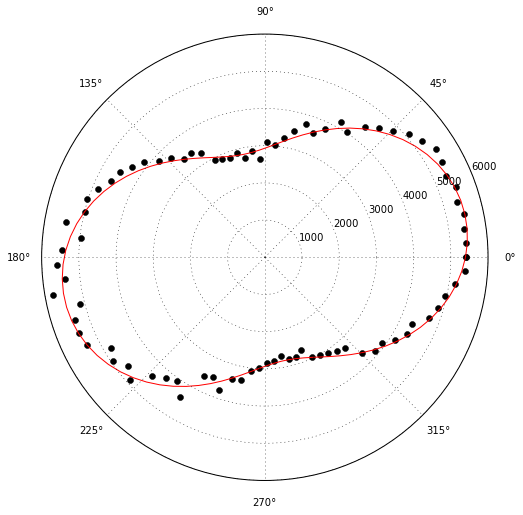

In [7]:
T1 = np.loadtxt(r'C:\Users\Ouyang Group\Documents\Data\10-14-16\MNP 4 on CPW 5mW scan 1 x173 y118 0.5mW rotor sweep 2')
T1[:,1] -= 1459
OrientPol(T1,False)

[  6.40621696e+02   7.70887580e-03   4.66701842e-01   4.73142292e+02
   9.26277525e+03]
(143.29779109411459, 95.90940821073464)


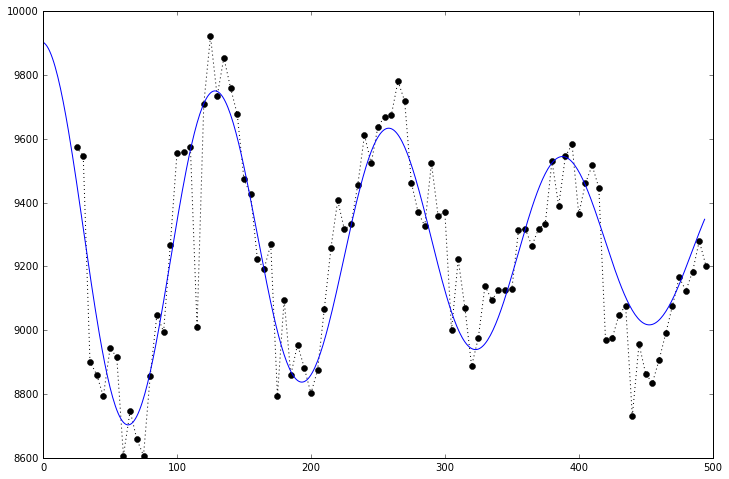

In [18]:
time,rabi0 = EPR_NoRef(r'C:\Users\Ouyang Group\Documents\Data\10-14-16\MNP 4 on CPW 5mW scan 1 x173 y118 T25 d5.4 th53 B0.5V upper Rabi *[0-9]',
              r'C:\Users\Ouyang Group\Documents\Data\10-14-16\MNP 4 on CPW 5mW scan 1 x173 y118 T25 d5.4 th53 B0.5V upper Rabi Pulse Seq')
#rabi0 = 100*rabi0/np.mean(rabi0)
opt0,cov0 = curve_fit(RabiFit,time[1:],rabi0[1:],maxfev=5500,p0=(600,10E-3,0,200,9000))
t = np.arange(0,np.max(time),1)
plt.plot(time[1:],rabi0[1:],'ko:')
plt.plot(t,RabiFit(t,*opt0),'b-')
print opt0
print (np.std(rabi0[1:]-RabiFit(time[1:],*opt0)),np.sqrt(np.mean(rabi0)))

[  3170.94803397   1226.29744786  52010.70349003]
(52333.122448979593, 0.0043713107021266318, 0.0046464338687690395)


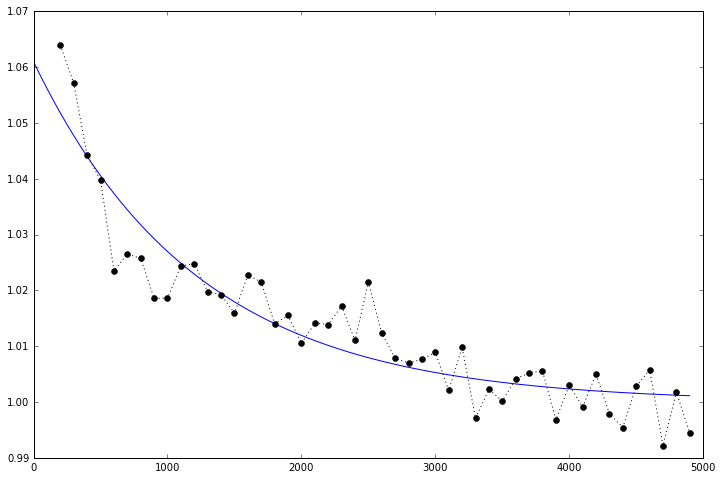

In [23]:
def T2Fit(t,C,tau,D):
    return C*np.exp(-t/tau)+D

time,hahn1 = EPR_NoRef(r'C:\Users\Ouyang Group\Documents\Data\10-14-16\MNP 4 on CPW 5mW scan 1 x173 y118 T25 d5.4 th53 B0.5V upper hahn *[0-9]',
              r'C:\Users\Ouyang Group\Documents\Data\10-14-16\MNP 4 on CPW 5mW scan 1 x173 y118 T25 d5.4 th53 B0.5V upper hahn Pulse Seq')
#hahn0 = hahn0-np.min(hahn0)
opt0,cov0 = curve_fit(T2Fit,time[1:],hahn1[1:],maxfev=5500,p0=(10000,1600,-np.min(hahn1)))
t = np.arange(10,np.max(time),1)
plt.plot(t,T2Fit(t,*opt0)/opt0[2],'b-')
plt.plot(time[1:],hahn1[1:]/opt0[2],'ko:')
print opt0
print (np.mean(hahn1),1/np.sqrt(np.mean(hahn1)),np.std(hahn1[-20:])/np.mean(hahn1[-20:]))

[ -5.08033703e+02   6.24600904e-03   7.94185634e+01   2.17542157e+02
   9.09489768e+03]


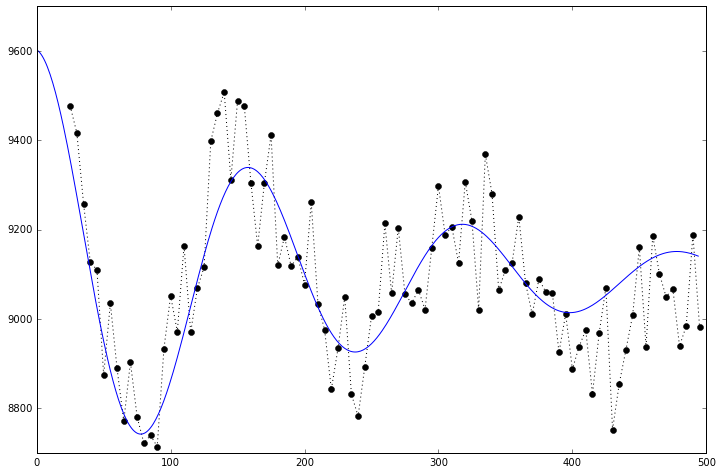

In [27]:
time,rabi0 = EPR_NoRef(r'C:\Users\Ouyang Group\Documents\Data\10-14-16\MNP 4 on CPW 5mW scan 1 x173 y118 T25 d5.4 th53 B0.5V lower rabi *[0-9]',
              r'C:\Users\Ouyang Group\Documents\Data\10-14-16\MNP 4 on CPW 5mW scan 1 x173 y118 T25 d5.4 th53 B0.5V lower rabi Pulse Seq')
#rabi0 = 100*rabi0/np.mean(rabi0)
opt0,cov0 = curve_fit(RabiFit,time[1:],rabi0[1:],maxfev=5500,p0=(600,10E-3,0,200,9000))
t = np.arange(0,np.max(time),1)
plt.plot(time[1:],rabi0[1:],'ko:')
plt.plot(t,RabiFit(t,*opt0),'b-')
print opt0

[  6.10989059e+00   7.53620441e-03   4.97297866e+00   6.53377796e+02
   1.00708510e+02]


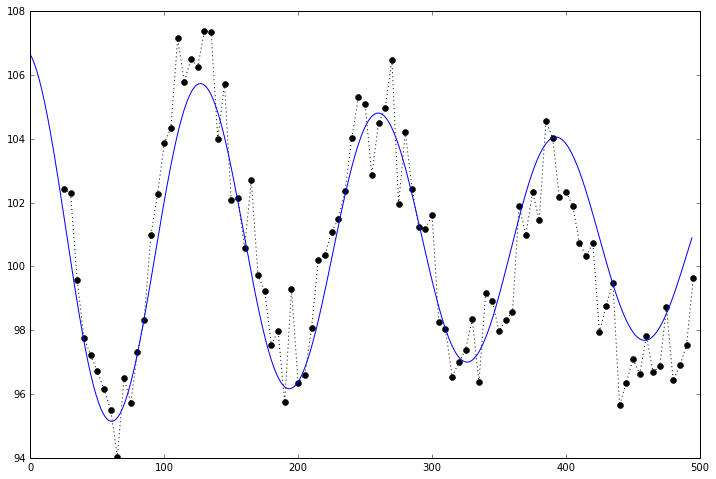

In [29]:
time,rabi0 = EPR_NoRef(r'C:\Users\Ouyang Group\Documents\Data\10-14-16\MNP 4 on CPW 5mW scan 1 x173 y118 T25 d5.4 th53 B0.5V high 2 rabi *[0-9]',
              r'C:\Users\Ouyang Group\Documents\Data\10-14-16\MNP 4 on CPW 5mW scan 1 x173 y118 T25 d5.4 th53 B0.5V high 2 rabi Pulse Seq')
rabi0 = 100*rabi0/np.mean(rabi0)
opt0,cov0 = curve_fit(RabiFit,time[1:],rabi0[1:],maxfev=5500,p0=(600,10E-3,0,200,9000))
t = np.arange(0,np.max(time),1)
plt.plot(time[1:],rabi0[1:],'ko:')
plt.plot(t,RabiFit(t,*opt0),'b-')
print opt0

[  5.89552515e+00   7.46303795e-03  -1.43981843e+00   4.21844588e+02
   1.00657105e+02]


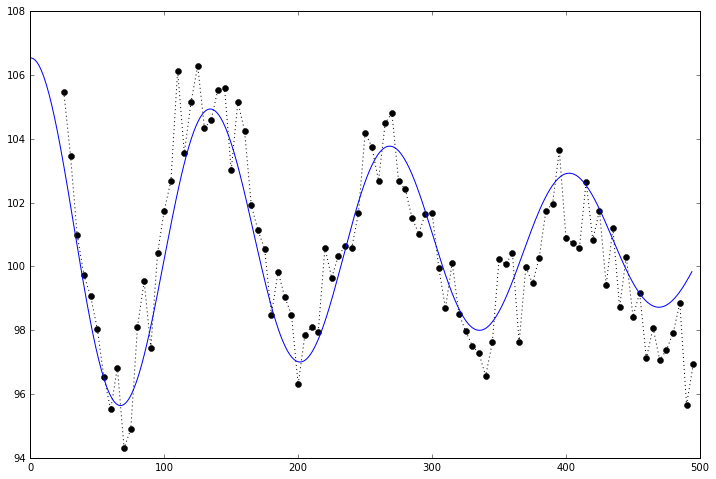

In [10]:
time,rabi0 = EPR_NoRef(r'C:\Users\Ouyang Group\Documents\Data\10-14-16\MNP 4 on CPW 5mW scan 1 x173 y118 T25 d5.4 th53 B0.5V high 3 rabi *[0-9]',
              r'C:\Users\Ouyang Group\Documents\Data\10-14-16\MNP 4 on CPW 5mW scan 1 x173 y118 T25 d5.4 th53 B0.5V high 3 rabi Pulse Seq')
rabi0 = 100*rabi0/np.mean(rabi0)
opt0,cov0 = curve_fit(RabiFit,time[1:],rabi0[1:],maxfev=5500,p0=(600,10E-3,0,200,9000))
t = np.arange(0,np.max(time),1)
plt.plot(time[1:],rabi0[1:],'ko:')
plt.plot(t,RabiFit(t,*opt0),'b-')
print opt0

[   651.68149185   3221.50182076  16397.26946774]
(16550.632653061224, 0.007773072175059249, 0.0071539713092959633)


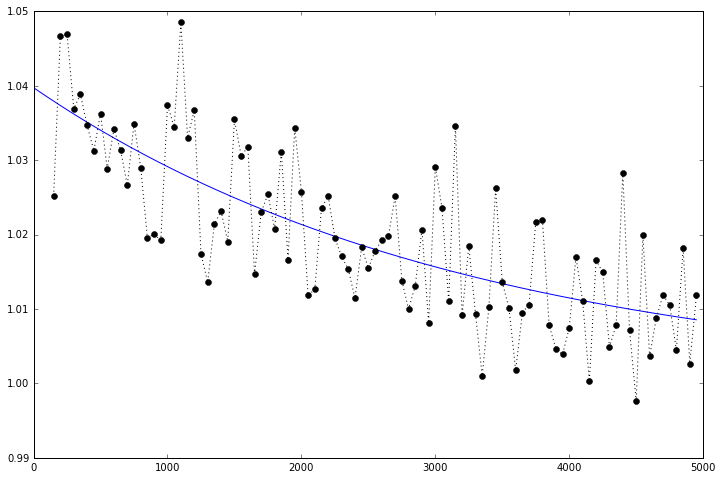

In [11]:
def T2Fit(t,C,tau,D):
    return C*np.exp(-t/tau)+D

time,hahn1 = EPR_NoRef(r'C:\Users\Ouyang Group\Documents\Data\10-14-16\MNP 4 on CPW 5mW scan 1 x173 y118 T25 d5.4 th53 B0.5V high 3 hahn *[0-9]',
              r'C:\Users\Ouyang Group\Documents\Data\10-14-16\MNP 4 on CPW 5mW scan 1 x173 y118 T25 d5.4 th53 B0.5V high 3 hahn Pulse Seq')
#hahn0 = hahn0-np.min(hahn0)
opt0,cov0 = curve_fit(T2Fit,time[1:],hahn1[1:],maxfev=5500,p0=(10000,1600,-np.min(hahn1)))
t = np.arange(10,np.max(time),1)
plt.plot(t,T2Fit(t,*opt0)/opt0[2],'b-')
plt.plot(time[1:],hahn1[1:]/opt0[2],'ko:')
print opt0
print (np.mean(hahn1),1/np.sqrt(np.mean(hahn1)),np.std(hahn1[-20:])/np.mean(hahn1[-20:]))

In [8]:
from bokeh.plotting import figure, output_file, show
from bokeh.io import output_notebook
from bokeh import palettes
output_notebook()
TOOLS = "save,box_zoom,box_select,crosshair,hover,resize,reset"
import pandas as pd
import glob

Loading BokehJS ...

In [88]:
theta = 0

files = glob.glob(r'C:\Users\Ouyang Group\Documents\Data\10-17-16\MNP 4 on CPW 5mW scan 1 x173 y118 T8.7 X6.5 Y1 ODMR *V.txt')
#output_file("10-17-16 MNP 4 on CPW 5mW scan 1 x173 y118 T8.7 X6.5 Y1 ODMR.html")
bsweep = pd.concat((pd.read_table(f) for f in files),axis=1).values
bsweep = np.nan_to_num(bsweep)
diffs = bsweep[:,1::3]
Bs = np.linspace(0,1.846114,len(files))*(11.7/0.5)
dB = Bs[1]-Bs[0]
p = figure(x_range=[Bs[0],Bs[-1]+dB], y_range=[bsweep[1,0],bsweep[-1,0]],tools=TOOLS)
p.image(image=[diffs],x=Bs[0], y=bsweep[1,0], dw=[Bs[-1]+dB-Bs[0]], dh=[bsweep[-1,0]-bsweep[1,0]], palette='RdPu9')
p.line(Bs,2.865E9+Bs*28E6,line_dash=(6,6),line_color='black')
p.line(Bs,2.865E9-Bs*28E6,line_dash=(6,6),line_color='black')
freq = bsweep[1:,0]
fits = np.zeros((diffs.shape[1],2))
V = np.linspace(0,1.846114,len(files))
for i in range(0,diffs.shape[1]):
    O = diffs[1:,i]*1000
    fits[i,0] = V[i]
    fits[i,1] = freq[np.argmin(O[freq<2.85E9])]
    
p.circle(fits[:,0],fits[:,1])
fits1 = fits
show(p)

In [81]:
O.shape

(750L,)

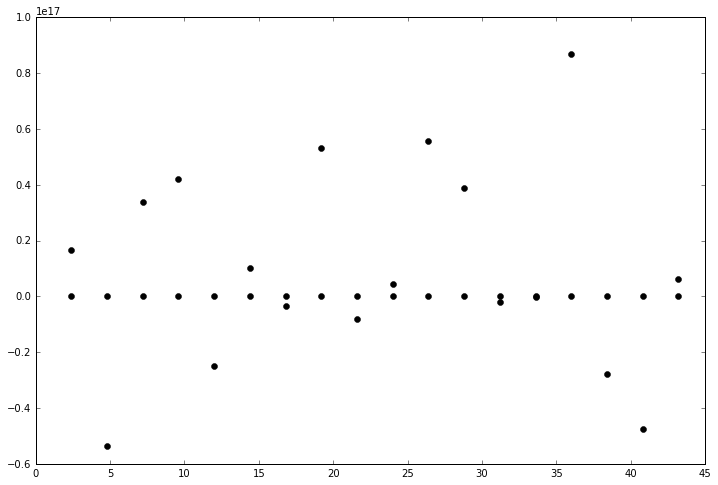

In [46]:
freq = bsweep[1:,1]
fits = np.zeros((diffs.shape[1],6))
for i in range(0,diffs.shape[1]):
    O = diffs[1:,i]*1000
    opt, cov = curve_fit(ODMRfit,freq,O,p0=(-4E8,freq[np.argmin(O)],1E7,-4E8,2.87E9*2-freq[np.argmin(O)],1E7),maxfev=2500)
    fits[i,:] = opt
    
mask = (fits[:,1]<fits[:,4])
mins = fits[:,1]*mask + fits[:,4]*~mask
maxs = fits[:,1]*~mask + fits[:,4]*mask
plt.plot(Bs[1:],mins[1:],'ko')
plt.plot(Bs[1:],maxs[1:],'ko')

In [34]:
files = glob.glob(r'C:\Users\Ouyang Group\Documents\Data\10-17-16\MNP 4 on CPW 5mW scan 1 x173 y118 T8.7 X6.5 Y1 low ODMR *V.txt')
#output_file("10-17-16 MNP 4 on CPW 5mW scan 1 x173 y118 T8.7 X6.5 Y1 ODMR.html")
bsweep = pd.concat((pd.read_table(f) for f in files),axis=1).values
bsweep = np.nan_to_num(bsweep)
diffs = bsweep[:,1::3]
Bs = np.linspace(2,3.0526,len(files))*(11.7/0.5)
p = figure(x_range=[Bs[0],Bs[-1]], y_range=[bsweep[1,0],bsweep[-1,0]],tools=TOOLS)
p.image(image=[diffs],x=Bs[0], y=bsweep[1,0], dw=[Bs[-1]-Bs[0]], dh=[bsweep[-1,0]-bsweep[1,0]], palette='RdPu9')
p.line(Bs,2.865E9+Bs*28E6,line_dash=(6,6),line_color='black')
p.line(Bs,2.865E9-Bs*28E6,line_dash=(6,6),line_color='black')
show(p)

In [86]:
files = glob.glob(r'C:\Users\Ouyang Group\Documents\Data\10-17-16\MNP 4 on CPW 5mW scan 1 x173 y118 T8.7 X6.5 Y1 very low ODMR *V.txt')
output_file("10-17-16 MNP 4 on CPW 5mW scan 1 x173 y118 T8.7 X6.5 Y1 very low ODMR.html")
bsweep = pd.concat((pd.read_table(f) for f in files),axis=1).values
bsweep = np.nan_to_num(bsweep)
diffs = bsweep[:,1::2]
Bs = np.linspace(3,4.28,len(files))*(10/0.5)
dB = Bs[1]-Bs[0]
p = figure(x_range=[Bs[0],Bs[-1]+dB], y_range=[bsweep[1,0],bsweep[-1,0]],tools=TOOLS)
p.image(image=[diffs],x=Bs[0], y=bsweep[1,0], dw=[Bs[-1]+dB-Bs[0]], dh=[bsweep[-1,0]-bsweep[1,0]], palette='RdPu9')
p.line(Bs,2.865E9+Bs*28E6,line_dash=(6,6),line_color='black')
p.line(Bs,2.865E9-Bs*28E6,line_dash=(6,6),line_color='black')
freq = bsweep[1:,0]
fits = np.zeros((diffs.shape[1],2))
V = np.linspace(3,4.28,len(files))
for i in range(0,diffs.shape[1]):
    O = diffs[1:,i]*1000
    fits[i,0] = V[i]
    fits[i,1] = freq[np.argmin(O)]
    
p.circle(fits[:,0],fits[:,1])
fits3 = fits
show(p)

In [93]:
files = glob.glob(r'C:\Users\Ouyang Group\Documents\Data\10-17-16\MNP 4 on CPW 5mW scan 1 x173 y118 T8.7 X6.5 Y1 really very low ODMR *V.txt')
output_file("10-17-16 MNP 4 on CPW 5mW scan 1 x173 y118 T8.7 X6.5 Y1 very low ODMR.html")
bsweep = pd.concat((pd.read_table(f) for f in files),axis=1).values
bsweep = np.nan_to_num(bsweep)
diffs = bsweep[:,1::2]
Bs = np.linspace(4.4,5.054,len(files))*(9/0.5)
dB = Bs[1]-Bs[0]
p = figure(x_range=[Bs[0],Bs[-1]+dB], y_range=[bsweep[1,0],bsweep[-1,0]],tools=TOOLS)
p.image(image=[diffs],x=Bs[0], y=bsweep[1,0], dw=[Bs[-1]+dB-Bs[0]], dh=[bsweep[-1,0]-bsweep[1,0]], palette='RdPu9')
p.line(Bs,2.865E9+Bs*28E6,line_dash=(6,6),line_color='black')
p.line(Bs,2.865E9-Bs*28E6,line_dash=(6,6),line_color='black')
freq = bsweep[1:,0]
fits = np.zeros((diffs.shape[1],2))
V = np.linspace(4.4,5.054,len(files))
for i in range(0,diffs.shape[1]):
    O = diffs[1:,i]*1000
    fits[i,0] = V[i]
    fits[i,1] = freq[np.argmin(O)]
    
p.circle(fits[:,0],fits[:,1])
fits4 = fits
#show(p)

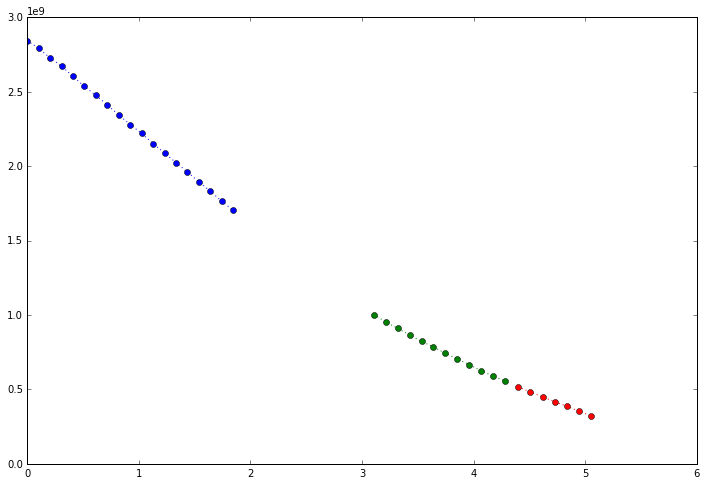

In [94]:
plt.plot(fits1[:,0],fits1[:,1],'o:')
plt.plot(fits3[1:,0],fits3[1:,1],'o:')
plt.plot(fits4[:,0],fits4[:,1],'o:')

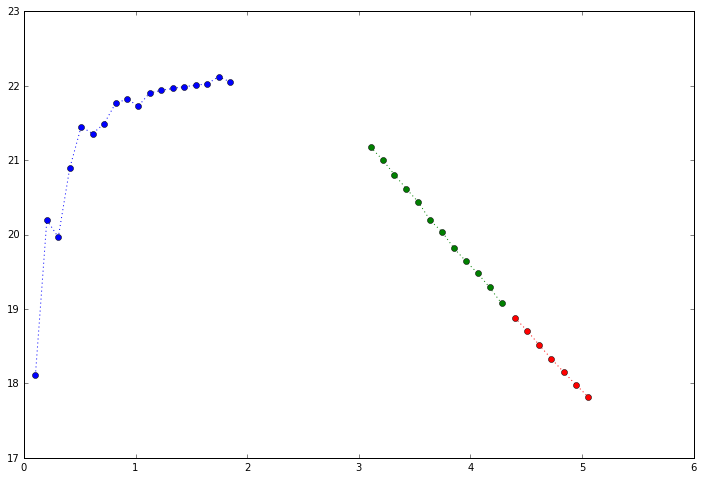

In [102]:
plt.plot(fits1[:,0],-(fits1[:,1]-fits1[0,1])/(28E6*fits1[:,0]),'o:')
plt.plot(fits3[1:,0],-(fits3[1:,1]-fits1[0,1])/(28E6*fits3[1:,0]),'o:')
plt.plot(fits4[:,0],-(fits4[:,1]-fits1[0,1])/(28E6*fits4[:,0]),'o:')

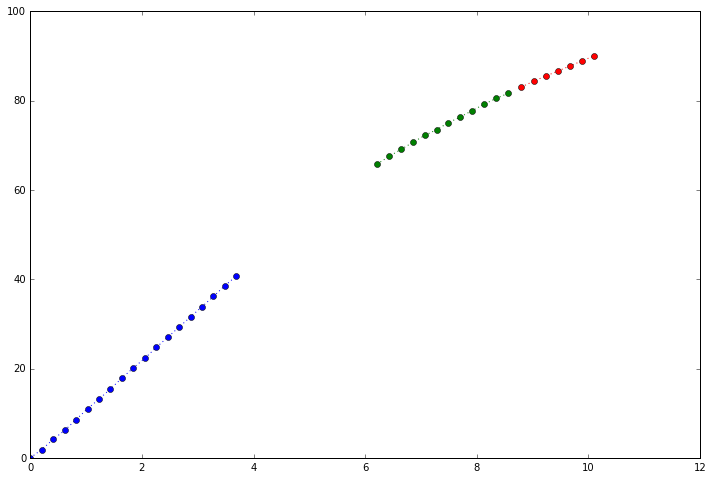

In [104]:
plt.plot(2*fits1[:,0],-(fits1[:,1]-fits1[0,1])/(28E6),'o:')
plt.plot(2*fits3[1:,0],-(fits3[1:,1]-fits1[0,1])/(28E6),'o:')
plt.plot(2*fits4[:,0],-(fits4[:,1]-fits1[0,1])/(28E6),'o:')

In [99]:
(fits1[:,1]-fits1[0,1])/fits1[:,0]

array([             nan,  -5.07010650e+08,  -5.65511816e+08,
        -5.59011740e+08,  -5.85012310e+08,  -6.00612593e+08,
        -5.98012566e+08,  -6.01726939e+08,  -6.09387824e+08,
        -6.11012852e+08,  -6.08412790e+08,  -6.13376538e+08,
        -6.14262925e+08,  -6.15012937e+08,  -6.15655797e+08,
        -6.16212955e+08,  -6.16700463e+08,  -6.19424784e+08,
        -6.17512992e+08])

[  5.57760559e+00   9.44235402e-03  -4.51540313e+00   5.23966646e+02
   1.00265386e+02]


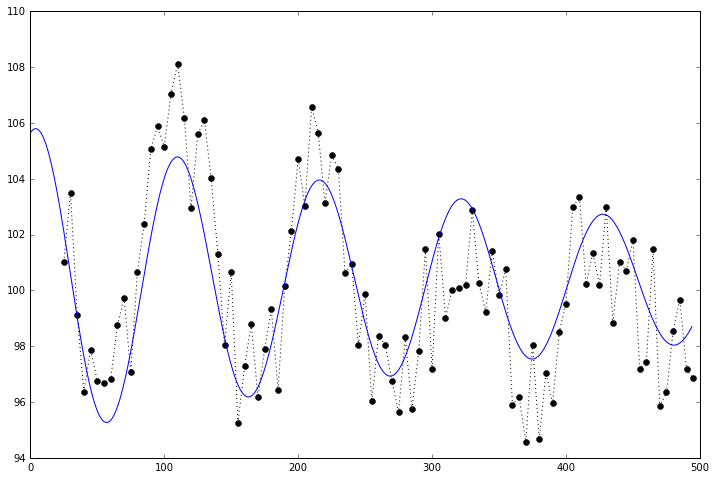

In [58]:
time,rabi0 = EPR_NoRef(r'C:\Users\Ouyang Group\Documents\Data\10-17-16\MNP 4 on CPW 5mW scan 1 x173 y118 T8.7 X6.5 Y1 B5V -6dbm 2 Rabi *[1-9]',
              r'C:\Users\Ouyang Group\Documents\Data\10-17-16\MNP 4 on CPW 5mW scan 1 x173 y118 T8.7 X6.5 Y1 B5V -6dbm 2 Rabi Pulse Seq')
rabi0 = 100*rabi0/np.mean(rabi0)
opt0,cov0 = curve_fit(RabiFit,time[1:],rabi0[1:],maxfev=5500,p0=(600,10E-3,0,200,9000))
t = np.arange(0,np.max(time),1)
plt.plot(time[1:],rabi0[1:],'ko:')
plt.plot(t,RabiFit(t,*opt0),'b-')
print opt0

In [2]:
def T2Fit(t,C,tau,D):
    return C*np.exp(-t/tau)+D

time,hahn1 = EPR_NoRef(r'C:\Users\Ouyang Group\Documents\Data\10-17-16\MNP 4 on CPW 5mW scan 1 x173 y118 T8.7 X6.5 Y1 B5V -6dbm Hahn *[0-9]',
              r'C:\Users\Ouyang Group\Documents\Data\10-17-16\MNP 4 on CPW 5mW scan 1 x173 y118 T8.7 X6.5 Y1 B5V -6dbm Hahn Pulse Seq')
#hahn0 = hahn0-np.min(hahn0)
opt0,cov0 = curve_fit(T2Fit,time[1:],hahn1[1:],maxfev=5500,p0=(10000,1600,-np.min(hahn1)))
t = np.arange(10,np.max(time),1)
plt.plot(t,T2Fit(t,*opt0)/opt0[2],'b-')
plt.plot(time[1:],hahn1[1:]/opt0[2],'ko:')
print opt0
print (np.mean(hahn1),1/np.sqrt(np.mean(hahn1)),np.std(hahn1[-20:])/np.mean(hahn1[-20:]))

NameError: name 'EPR' is not defined